# Lab Assignment - 7

### CS22B1093 - Rohan G

### Generative Adversarial Networks (GANs)

--------------------

In [1]:
!rm -rf /kaggle/working/*

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import torch
import torchvision.datasets as datasets

In [3]:
import os
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T

image_folder = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/"

image_size = 64
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) 
transform = T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)
])

class CelebAImages(Dataset):
    def __init__(self, image_folder, transform=None):
        self.image_folder = image_folder
        self.image_names = sorted(os.listdir(image_folder))  # Sort to maintain order
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_name = self.image_names[idx]
        img_path = os.path.join(self.image_folder, img_name)

        # Load image
        image = Image.open(img_path).convert("RGB")

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        return image

train_ds = CelebAImages(image_folder=image_folder, transform=transform)

batch_size = 128
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

images = next(iter(train_dl))
print(f"Batch shape: {images.shape}")


Batch shape: torch.Size([128, 3, 64, 64])


In [4]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import torchvision.utils as vutils
%matplotlib inline

In [5]:
def denorm(tensor, stats=((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))):
    mean, std = stats
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean 

In [6]:
def show_images(images, nmax=64):
    images = denorm(images.cpu()) 
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(vutils.make_grid(images[:nmax], nrow=8).permute(1, 2, 0))
    plt.show()

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

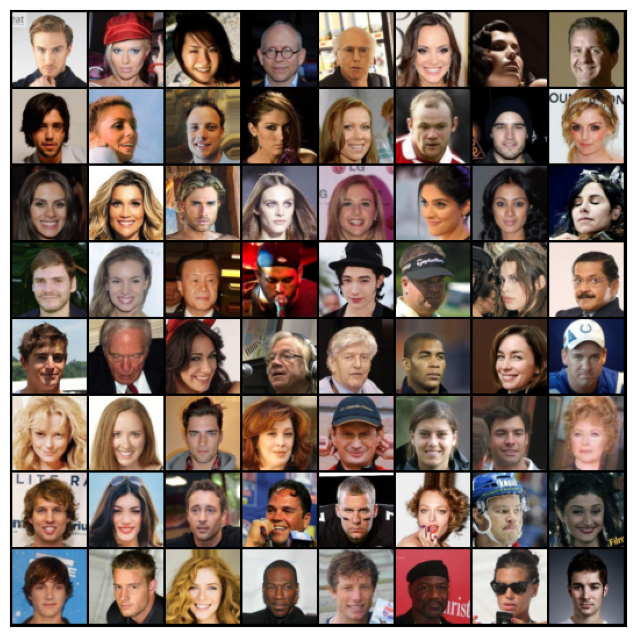

In [7]:
plt.close('all')
show_batch(train_dl)

In [8]:
 def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)  # Correct: "self.device"

In [9]:
device = get_default_device()
device

device(type='cuda')

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:
train_dl = DeviceDataLoader(train_dl, device)

In [12]:
import torch.nn as nn

### Discriminator

In [13]:
discriminator = nn.Sequential(
    # 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace = True),

    # 64 x 32 x 32
    nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace = True),

    # 128 x 16 x 16
    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace = True),

    # 256 x 8 x 8
    nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace = True),

    # 512 x 4 x 4
    nn.Conv2d(512, 1, kernel_size = 4, stride = 2, padding = 0, bias = False),

    # 1 x 1 x 1
    nn.Flatten(),
    nn.Sigmoid()
)

In [14]:
discriminator = to_device(discriminator, device)

In [15]:
latent_size = 128

### Generator

In [16]:
generator = nn.Sequential(
    # 128 x 1 x 1
    nn.ConvTranspose2d(latent_size, 512, kernel_size = 4, stride = 1, padding = 0, bias = False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    # 512 x 4 x 4
    nn.ConvTranspose2d(512, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    # 256 x 8 x 8
    nn.ConvTranspose2d(256, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    # 128 x 16 x 16
    nn.ConvTranspose2d(128, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    # 64 x 32 x 32
    nn.ConvTranspose2d(64, 3, kernel_size = 4, stride = 2, padding = 1, bias=False),
    nn.Tanh() # -1 to 1

    # 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


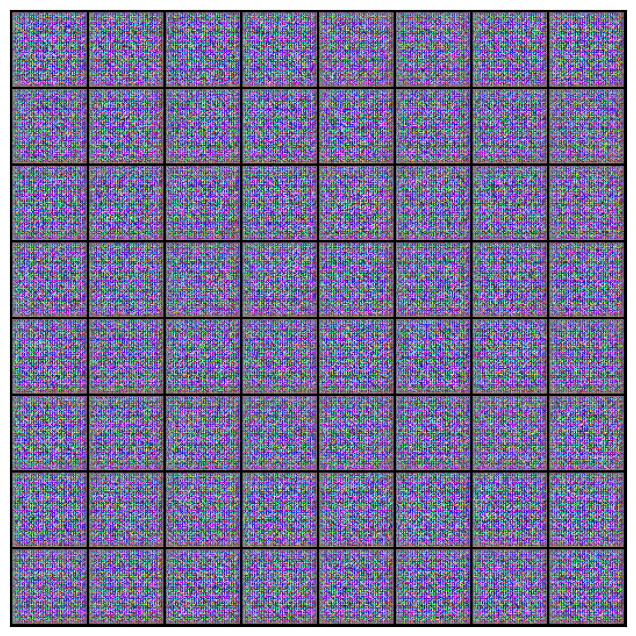

In [17]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [18]:
generator = to_device(generator, device)

In [19]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [20]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [21]:
from torchvision.utils import save_image

Saved: generated-images-0000.png


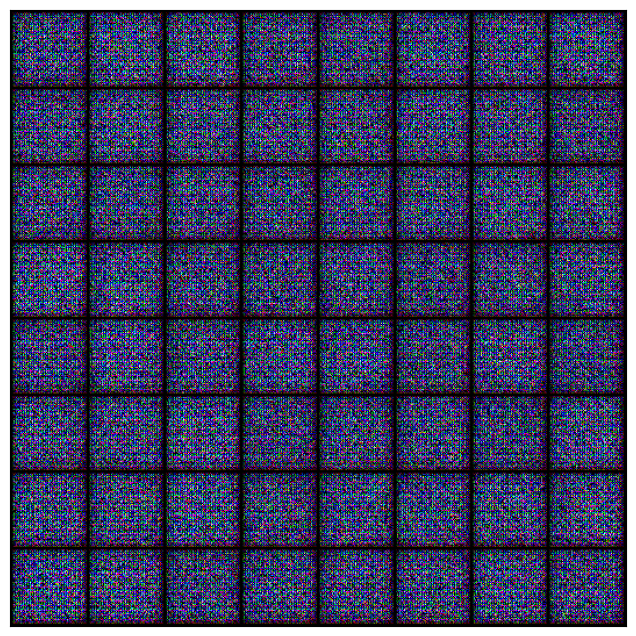

In [22]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

sample_dir = "generated_samples"
os.makedirs(sample_dir, exist_ok=True)

import matplotlib.pyplot as plt
import torchvision.utils as vutils

def save_sample(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors).detach().cpu()
    fake_fname = f'generated-images-{index:04d}.png'
    
    save_image(fake_images, os.path.join(sample_dir, fake_fname), nrow=8)
    print(f"Saved: {fake_fname}")

    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(vutils.make_grid(fake_images, nrow=8).permute(1, 2, 0))
        plt.show()


save_sample(0, fixed_latent)


In [23]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [24]:
from tqdm.notebook import tqdm

def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images in tqdm(train_dl):
            real_images = real_images.to(device)
            
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")
    
        # Save and display generated images
        save_sample(epoch + start_idx, fixed_latent, show=True)
    
    return losses_g, losses_d, real_scores, fake_scores

In [25]:
lr = 0.0002
epochs = 25

0it [00:00, ?it/s]

Epoch [1/25], loss_g: 3.5216, loss_d: 0.2927, real_score: 0.8648, fake_score: 0.1159
Saved: generated-images-0001.png


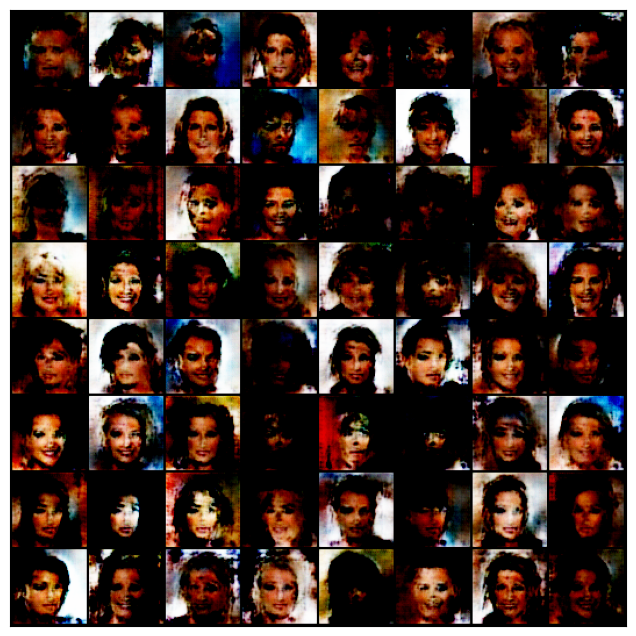

0it [00:00, ?it/s]

Epoch [2/25], loss_g: 2.7002, loss_d: 0.3286, real_score: 0.8461, fake_score: 0.1237
Saved: generated-images-0002.png


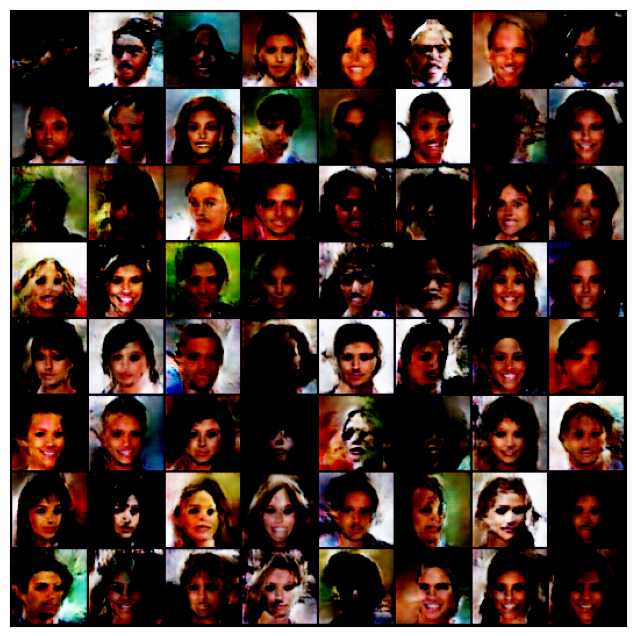

0it [00:00, ?it/s]

Epoch [3/25], loss_g: 4.5510, loss_d: 0.1312, real_score: 0.9826, fake_score: 0.1029
Saved: generated-images-0003.png


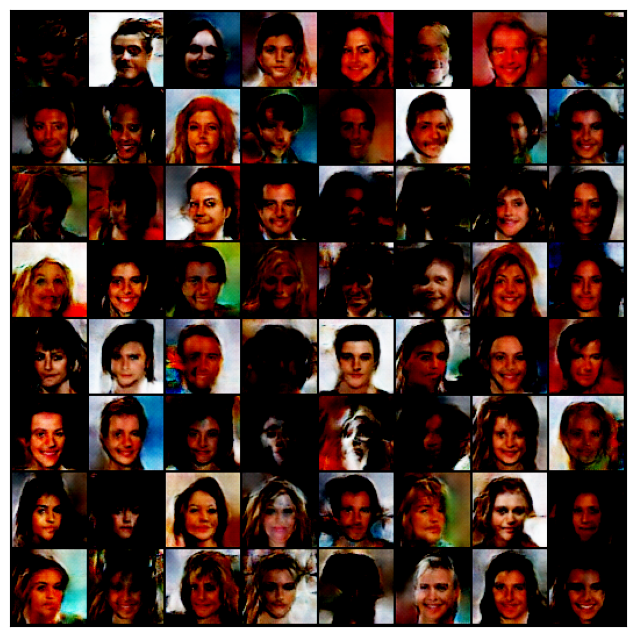

0it [00:00, ?it/s]

Epoch [4/25], loss_g: 3.5028, loss_d: 0.2166, real_score: 0.8311, fake_score: 0.0187
Saved: generated-images-0004.png


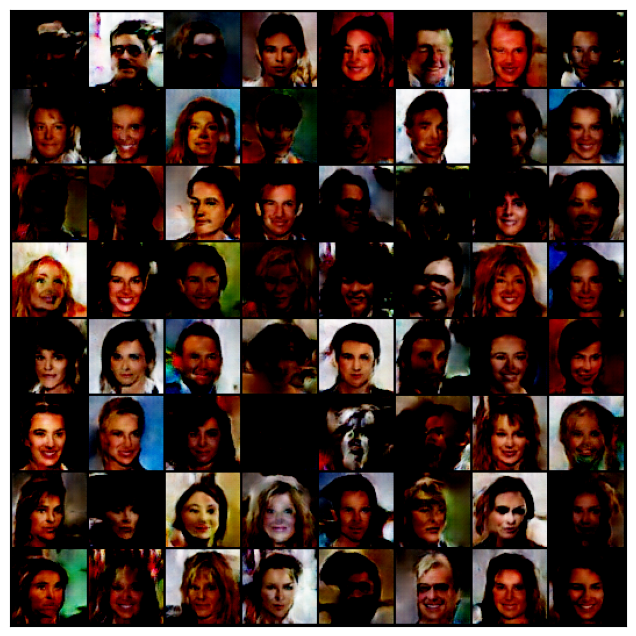

0it [00:00, ?it/s]

Epoch [5/25], loss_g: 3.8741, loss_d: 0.2342, real_score: 0.9252, fake_score: 0.1321
Saved: generated-images-0005.png


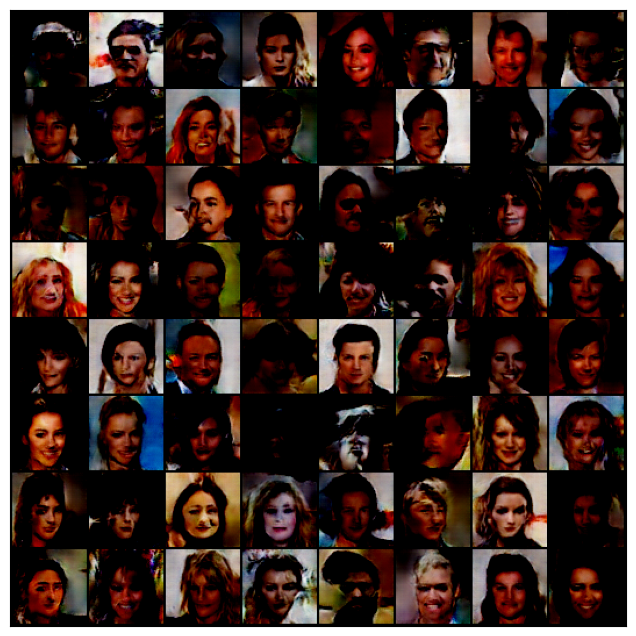

0it [00:00, ?it/s]

Epoch [6/25], loss_g: 3.3722, loss_d: 0.1309, real_score: 0.9171, fake_score: 0.0375
Saved: generated-images-0006.png


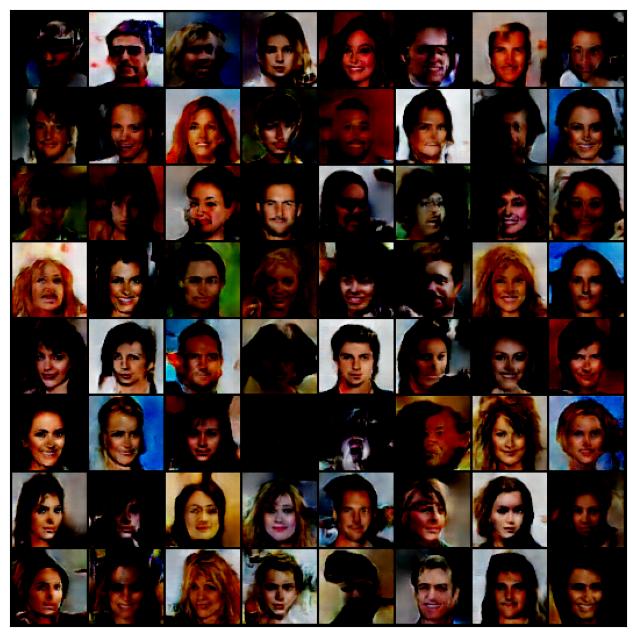

0it [00:00, ?it/s]

Epoch [7/25], loss_g: 5.0571, loss_d: 0.1689, real_score: 0.9877, fake_score: 0.1332
Saved: generated-images-0007.png


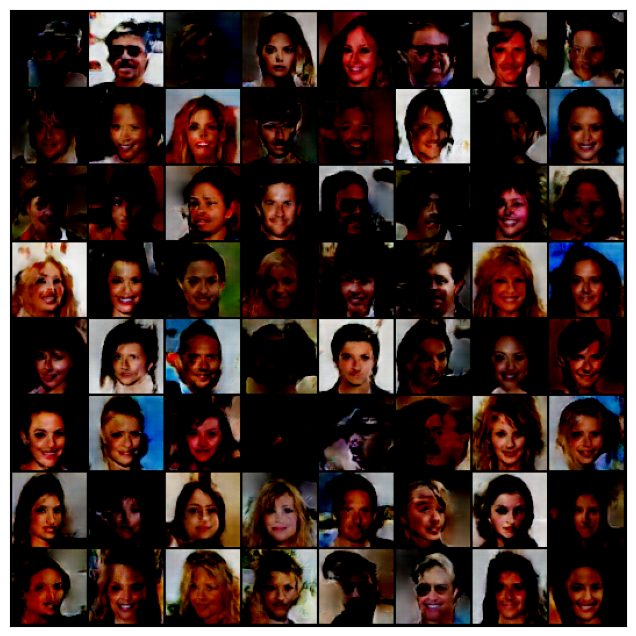

0it [00:00, ?it/s]

Epoch [8/25], loss_g: 2.9339, loss_d: 0.3760, real_score: 0.8338, fake_score: 0.1381
Saved: generated-images-0008.png


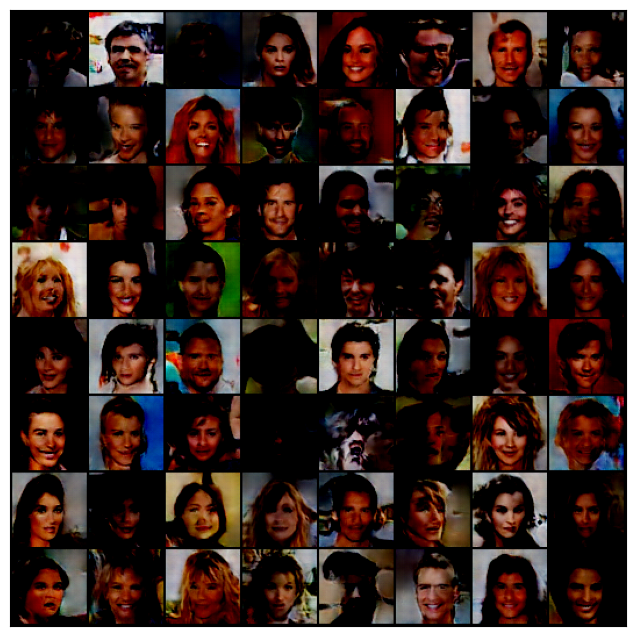

0it [00:00, ?it/s]

Epoch [9/25], loss_g: 5.0175, loss_d: 0.0906, real_score: 0.9527, fake_score: 0.0355
Saved: generated-images-0009.png


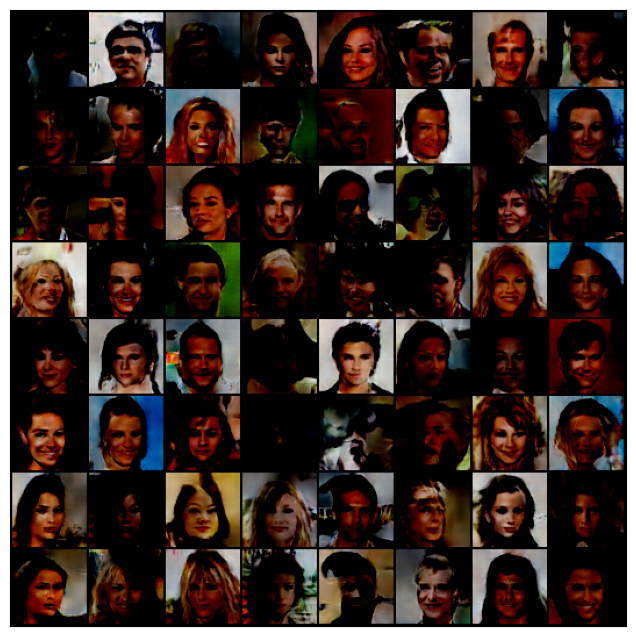

0it [00:00, ?it/s]

Epoch [10/25], loss_g: 4.5782, loss_d: 0.0479, real_score: 0.9923, fake_score: 0.0376
Saved: generated-images-0010.png


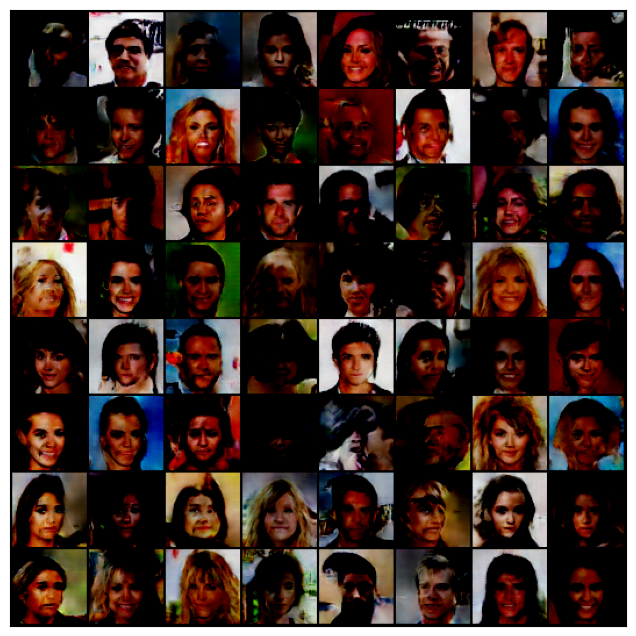

0it [00:00, ?it/s]

Epoch [11/25], loss_g: 2.3072, loss_d: 0.3128, real_score: 0.9933, fake_score: 0.2103
Saved: generated-images-0011.png


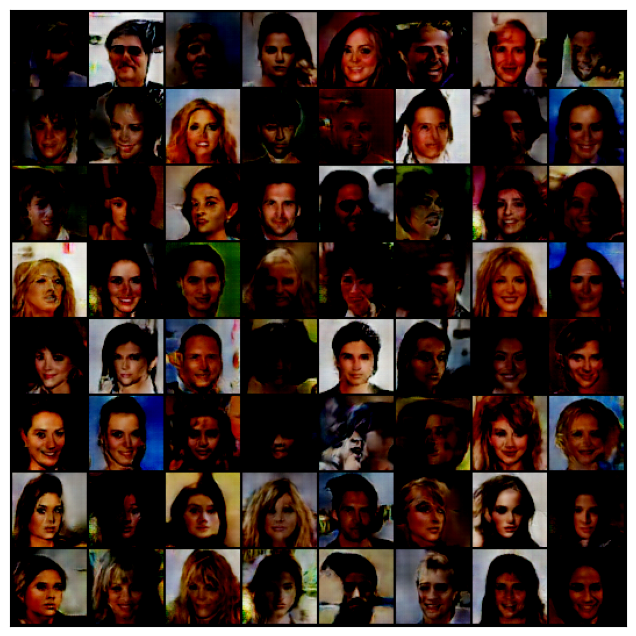

0it [00:00, ?it/s]

Epoch [12/25], loss_g: 5.0200, loss_d: 0.0505, real_score: 0.9628, fake_score: 0.0109
Saved: generated-images-0012.png


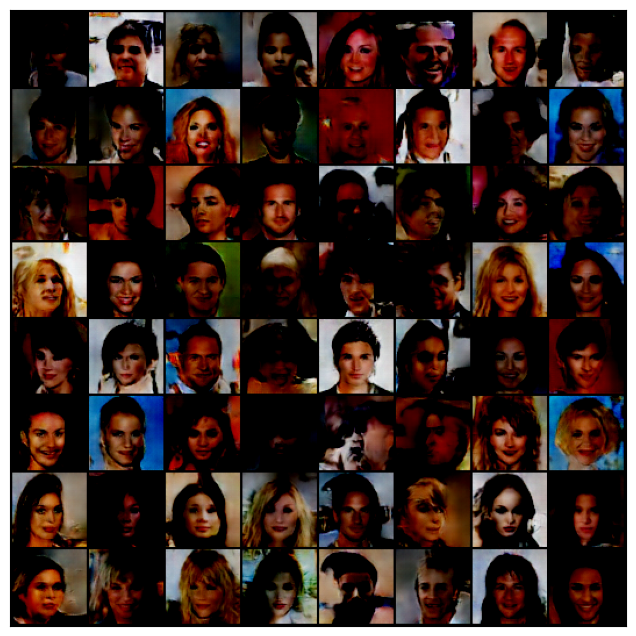

0it [00:00, ?it/s]

Epoch [13/25], loss_g: 4.9549, loss_d: 0.1028, real_score: 0.9195, fake_score: 0.0103
Saved: generated-images-0013.png


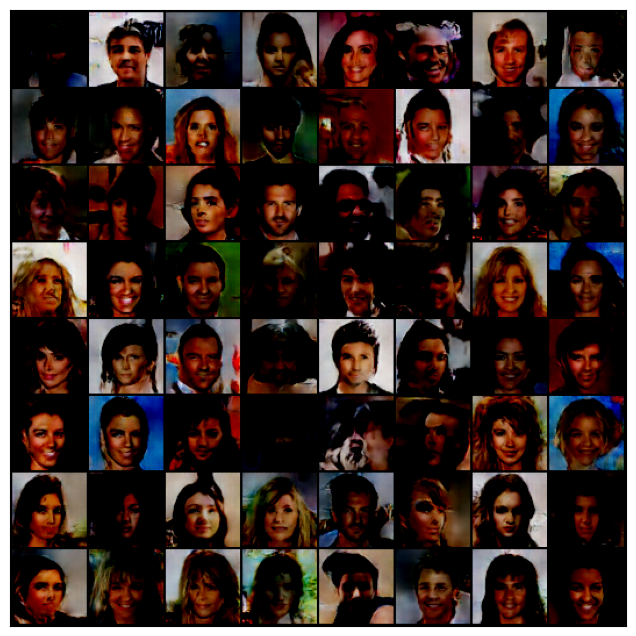

0it [00:00, ?it/s]

Epoch [14/25], loss_g: 3.4752, loss_d: 0.2008, real_score: 0.8800, fake_score: 0.0314
Saved: generated-images-0014.png


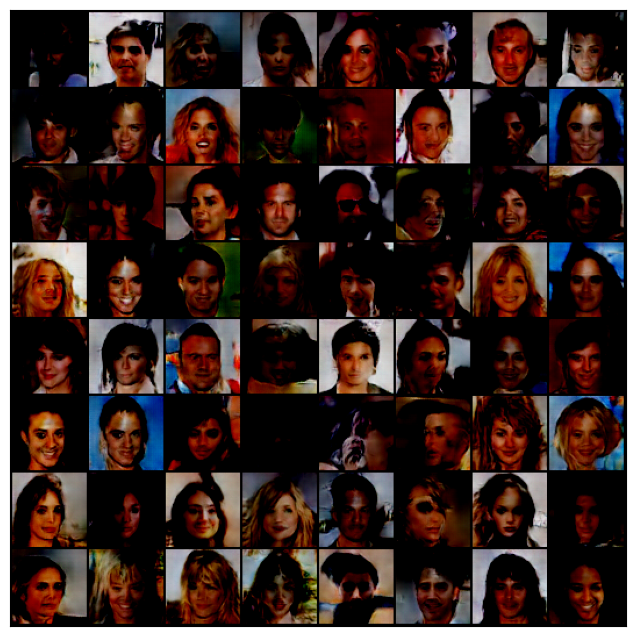

0it [00:00, ?it/s]

Epoch [15/25], loss_g: 5.5948, loss_d: 0.0489, real_score: 0.9604, fake_score: 0.0069
Saved: generated-images-0015.png


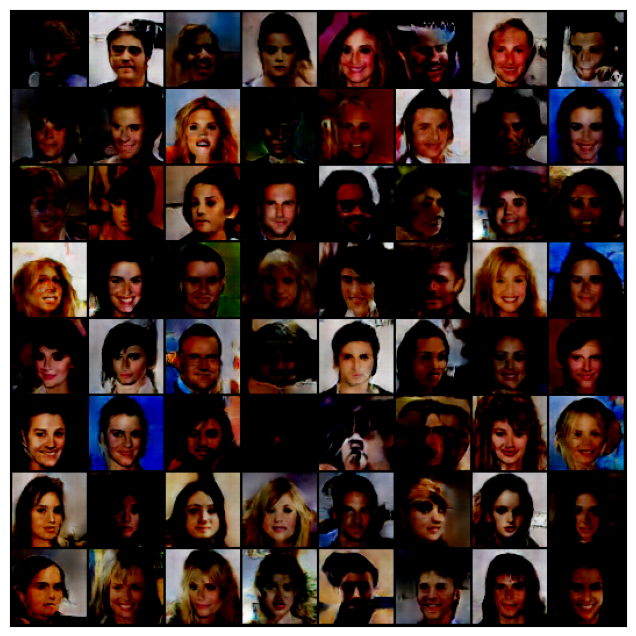

0it [00:00, ?it/s]

Epoch [16/25], loss_g: 4.4725, loss_d: 0.1022, real_score: 0.9750, fake_score: 0.0648
Saved: generated-images-0016.png


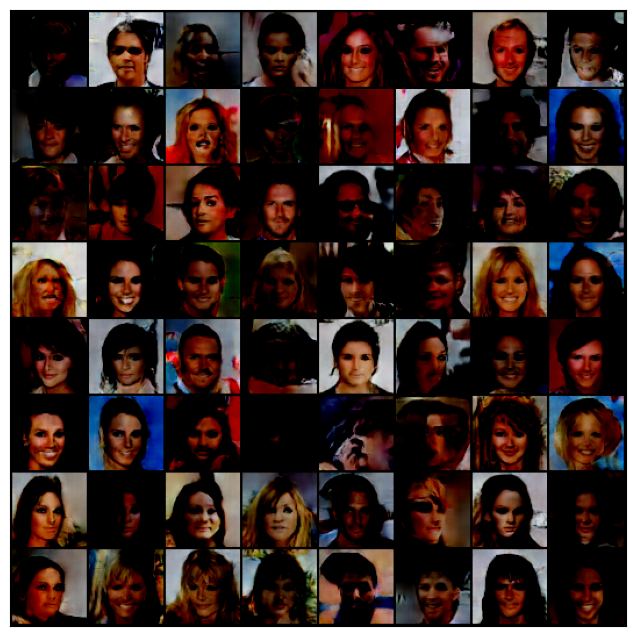

0it [00:00, ?it/s]

Epoch [17/25], loss_g: 5.4548, loss_d: 0.0816, real_score: 0.9349, fake_score: 0.0056
Saved: generated-images-0017.png


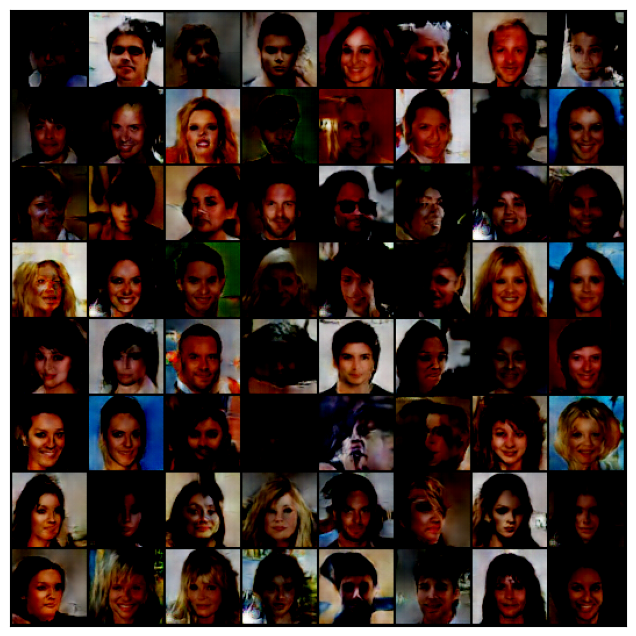

0it [00:00, ?it/s]

Epoch [18/25], loss_g: 5.0622, loss_d: 0.0646, real_score: 0.9565, fake_score: 0.0174
Saved: generated-images-0018.png


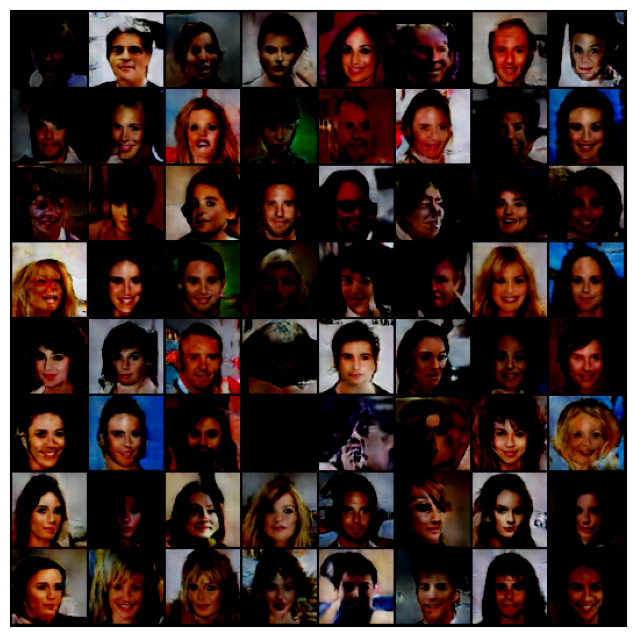

0it [00:00, ?it/s]

Epoch [20/25], loss_g: 6.1702, loss_d: 0.0592, real_score: 0.9799, fake_score: 0.0352
Saved: generated-images-0020.png


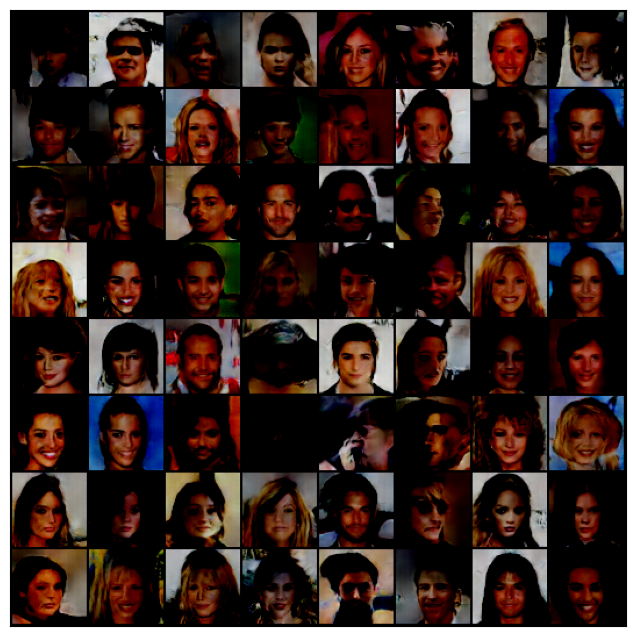

0it [00:00, ?it/s]

Epoch [21/25], loss_g: 6.4045, loss_d: 0.1149, real_score: 0.9825, fake_score: 0.0865
Saved: generated-images-0021.png


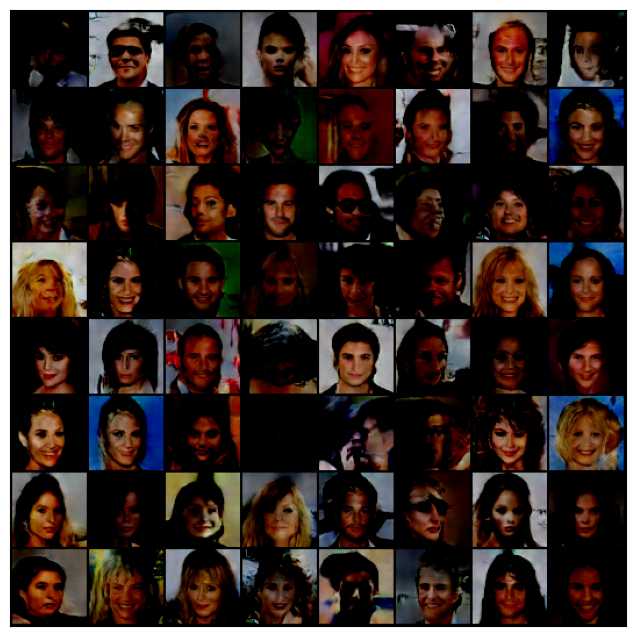

0it [00:00, ?it/s]

Epoch [22/25], loss_g: 5.5719, loss_d: 0.0475, real_score: 0.9608, fake_score: 0.0055
Saved: generated-images-0022.png


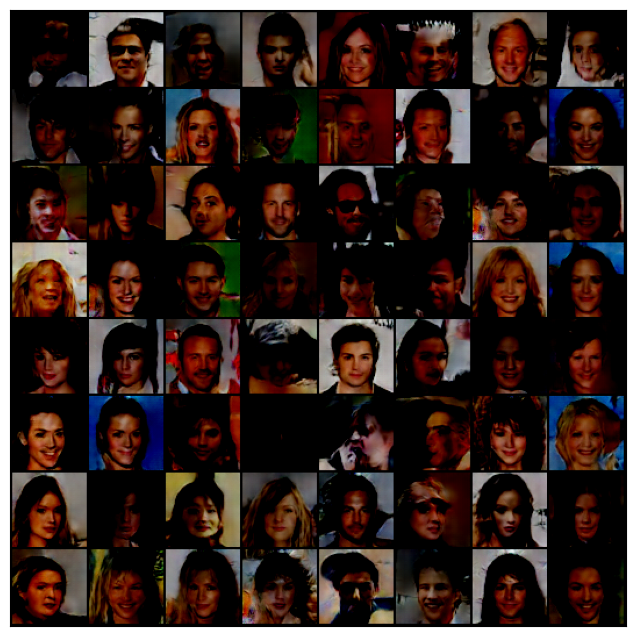

0it [00:00, ?it/s]

Epoch [23/25], loss_g: 1.0448, loss_d: 4.7052, real_score: 0.0354, fake_score: 0.0000
Saved: generated-images-0023.png


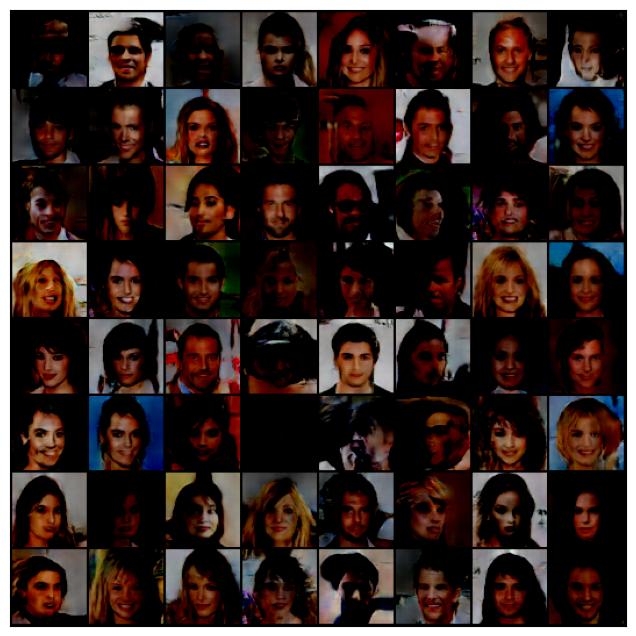

0it [00:00, ?it/s]

Epoch [24/25], loss_g: 4.8051, loss_d: 0.0818, real_score: 0.9692, fake_score: 0.0451
Saved: generated-images-0024.png


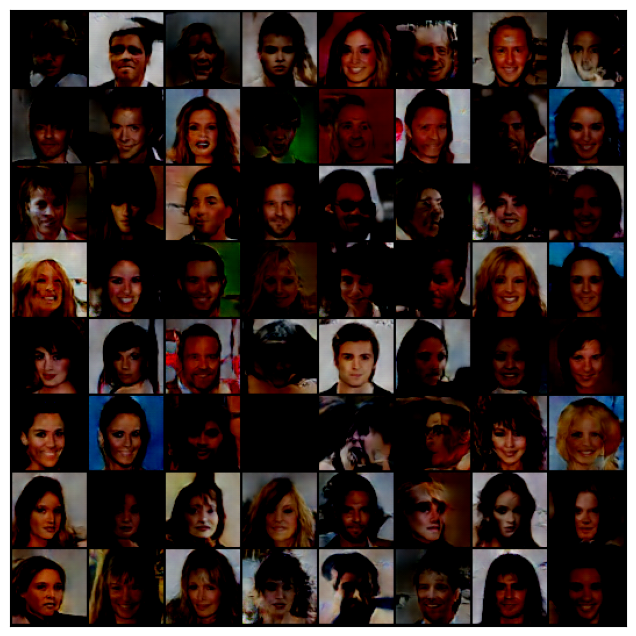

0it [00:00, ?it/s]

Epoch [25/25], loss_g: 5.6320, loss_d: 0.0515, real_score: 0.9711, fake_score: 0.0195
Saved: generated-images-0025.png


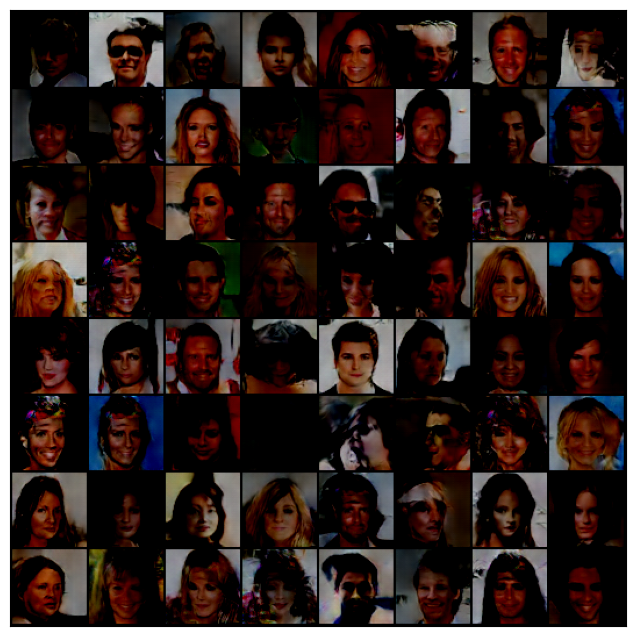

In [26]:
history = fit(epochs, lr)

In [27]:
losses_g, losses_d, real_scores, fake_scores = history

In [28]:
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

In [29]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

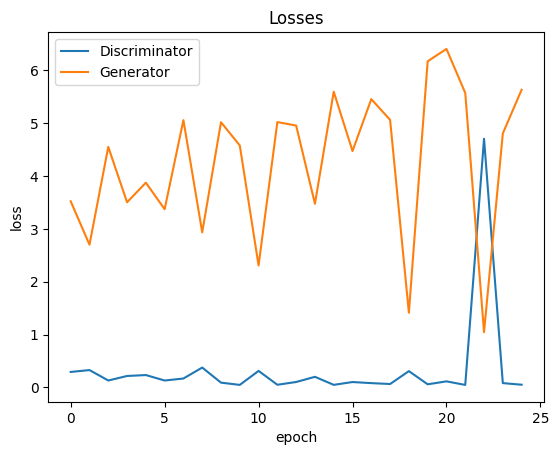

In [30]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

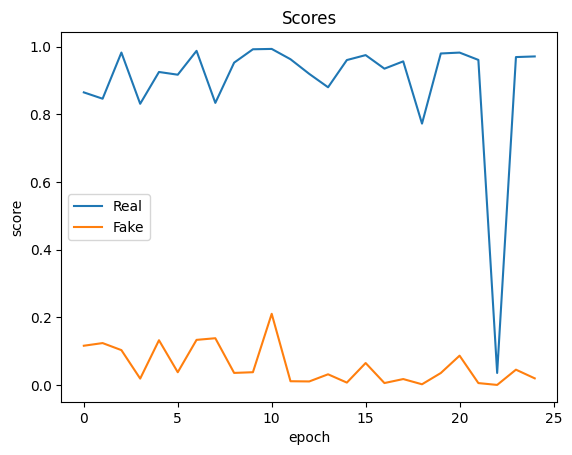

In [31]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');